In [111]:
import subprocess
import warnings ; warnings.warn = lambda *args,**kwargs: None

In [112]:
import pandas as pd
import folium
from folium.plugins import HeatMap
import osmnx as ox
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import pysal
import esda
from pysal.lib import weights
from pysal.explore import esda
from pysal.viz import splot
import seaborn as sns
import contextily as ctx
import mapclassify as mc
import cartopy.crs as ccrs
from splot.esda import lisa_cluster, moran_scatterplot, plot_local_autocorrelation

In [113]:
hurto_a_persona = pd.read_csv("C:\\Users\\johng\\OneDrive\\Documentos\\hurto_a_persona.csv", low_memory=False)
hurto_a_persona['fecha_hecho'] = pd.to_datetime(hurto_a_persona['fecha_hecho'])

In [114]:
media_lat = hurto_a_persona['latitud'].mean()
std_lat = hurto_a_persona['latitud'].std()

media_long = hurto_a_persona['longitud'].mean()
std_long = hurto_a_persona['longitud'].std()

factor = 2

limite_inferior_lat = media_lat - factor * std_lat
limite_superior_lat = media_lat + factor * std_lat

limite_inferior_long = media_long - factor * std_long
limite_superior_long = media_long + factor * std_long

hurto_a_persona_filtrado = hurto_a_persona[
    (hurto_a_persona['latitud'] >= limite_inferior_lat) &
    (hurto_a_persona['latitud'] <= limite_superior_lat) &
    (hurto_a_persona['longitud'] >= limite_inferior_long) &
    (hurto_a_persona['longitud'] <= limite_superior_long)
]

<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\johng\AppData\Local\Temp\ipykernel_21380\3592089299.py:1: SyntaxWarning: invalid escape sequence '\D'
  barrios = gpd.read_file("C:\\Users\\johng\Downloads\\trabajo_grado\\medellin.shp")


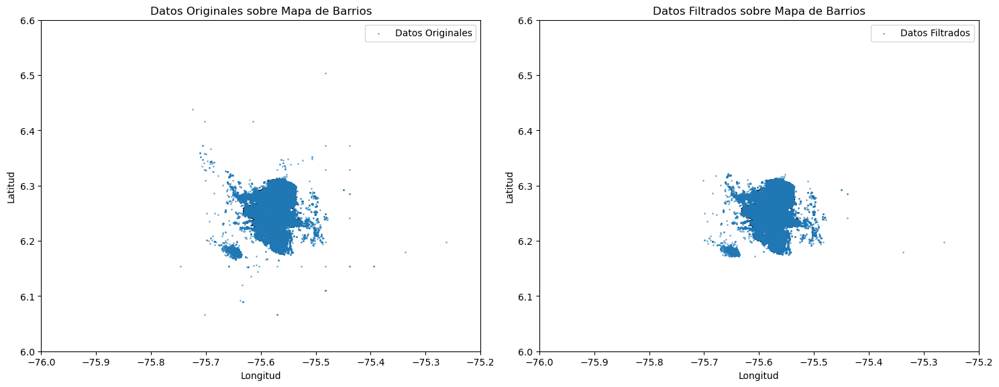

In [115]:
barrios = gpd.read_file("C:\\Users\\johng\Downloads\\trabajo_grado\\medellin.shp")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

barrios.plot(ax=ax1, edgecolor='black', color='white')
ax1.scatter(hurto_a_persona['longitud'], hurto_a_persona['latitud'], s=1, alpha=0.5, label='Datos Originales')
ax1.set_title('Datos Originales sobre Mapa de Barrios')
ax1.set_xlabel('Longitud')
ax1.set_ylabel('Latitud')
ax1.set_xlim(-76, -75.2)
ax1.set_ylim(6, 6.6)
ax1.legend()

barrios.plot(ax=ax2, edgecolor='black', color='white')
ax2.scatter(hurto_a_persona_filtrado['longitud'], hurto_a_persona_filtrado['latitud'], s=1, alpha=0.5, label='Datos Filtrados')
ax2.set_title('Datos Filtrados sobre Mapa de Barrios')
ax2.set_xlabel('Longitud')
ax2.set_ylabel('Latitud')
ax2.set_xlim(-76, -75.2)
ax2.set_ylim(6, 6.6)
ax2.legend()

plt.tight_layout()
plt.show()
hurto_a_persona = hurto_a_persona_filtrado

In [116]:
datos_limpios = hurto_a_persona.dropna(subset=['latitud', 'longitud'])
datos_limpios = datos_limpios[(datos_limpios['latitud'] != 0) & (datos_limpios['longitud'] != 0)]

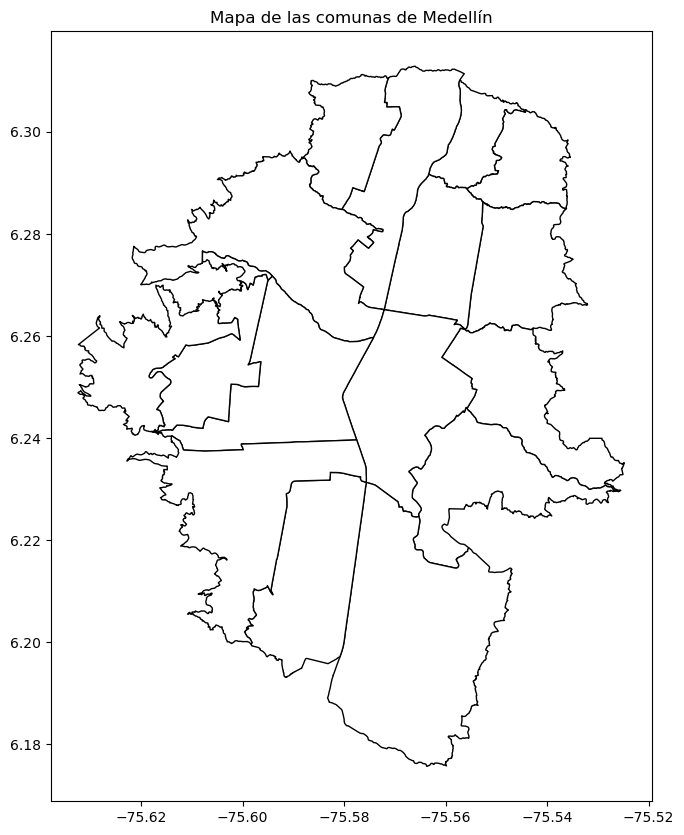

In [117]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(ax=ax, edgecolor='black', color='white')
plt.title('Mapa de las comunas de Medellín')
plt.show()

In [118]:
gdf_hurtos = gpd.GeoDataFrame(datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud), crs='EPSG:4326')
gdf_hurtos.head(5)

,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,sede_receptora,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion,geometry
0,2017-01-01 01:00:00-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Doce de Octubre,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.58202 6.29970)
1,2017-01-01 15:00:00-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Candelaria,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.56616 6.25092)
2,2017-01-01 14:00:00-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.55491 6.27484)
3,2017-01-01 16:00:00-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.55353 6.27624)
4,2017-01-01 16:00:00-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Laureles,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.58691 6.25034)


In [119]:
hurto_barrios = gpd.sjoin(gdf_hurtos, barrios)

In [120]:
hurto_counts = hurto_barrios.groupby('index_right').size()
barrios['hurto_count'] = barrios.index.map(hurto_counts).fillna(0)

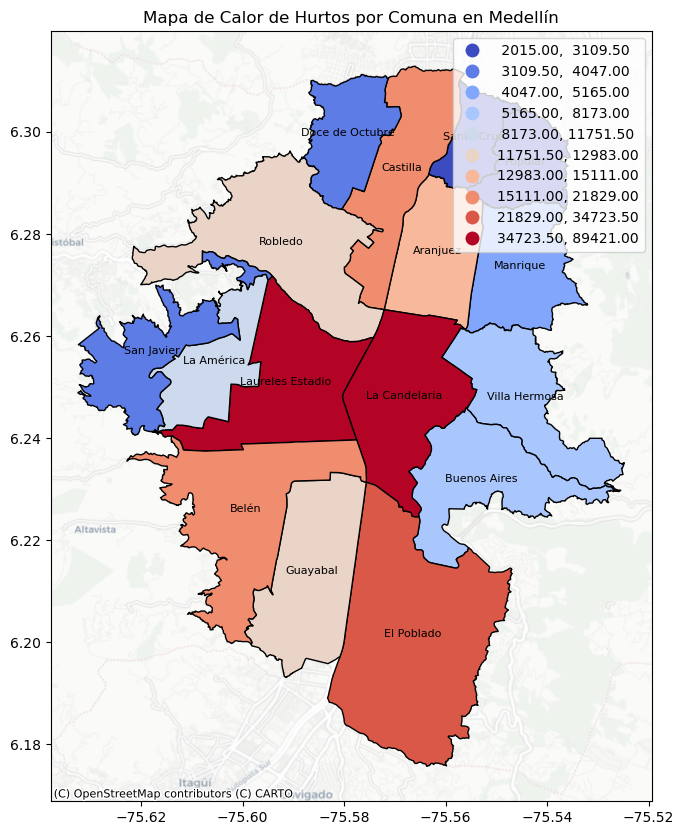

In [121]:
classifier = mc.Quantiles(barrios['hurto_count'], k=12)

fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='coolwarm', scheme='Quantiles', classification_kwds={'k': 10}, edgecolor='black')

for idx, row in barrios.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['NOMBRE'], fontsize=8, ha='center', color='black')

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios.crs.to_string())

plt.title('Mapa de Calor de Hurtos por Comuna en Medellín')

plt.show()


In [122]:
from sklearn.preprocessing import StandardScaler
df = pd.read_excel("C:\\Users\\johng\\Downloads\\trabajo_grado\\panel_data.xlsx", engine='openpyxl')

scaler = StandardScaler()

df['tasa_hurtos_normalizada'] = scaler.fit_transform(df[['tasa_hurtos']])
df.set_index(['comuna', 'year'], inplace=True)
df.head(100)

,,cantidad_hurtos,Tasa_Desempleo,Poblacion,Tasa_informalidad,tasa_hurtos,Tasa_alimentos,ingresos,tasa_hurtos_carro,_ID,tasa_hurtos_normalizada
comuna,year,,,,,,,,,,
Comuna 1,2014,35,11.479819,129781.000000,55.252740,26.968508,7.436930,0.135000,5.393702,1,-0.555191
Comuna 2,2014,43,11.194617,110858.000000,52.265030,38.788360,6.153720,0.243000,6.314384,2,-0.550788
Comuna 3,2014,91,10.974426,158877.000000,49.128830,57.277013,4.570557,1.171000,17.623696,3,-0.543900
Comuna 4,2014,386,9.544182,161885.000000,45.145920,238.440869,5.647207,1.179000,46.946907,4,-0.476410
Comuna 5,2014,494,7.699793,149133.000000,42.089470,331.247946,1.315012,3.621000,63.701528,5,-0.441836
...,...,...,...,...,...,...,...,...,...,...,...
Comuna 16,2019,3105,9.553595,210495.339219,38.454965,1475.092043,2.804501,14.511442,40.856012,16,-0.015711
Comuna 1,2020,280,22.940308,143039.000000,48.876900,195.750809,15.207962,0.111745,11.185761,1,-0.492313
Comuna 2,2020,231,21.885517,117744.000000,48.606846,196.188341,14.245848,0.287788,11.040902,2,-0.492150


In [123]:
datos = barrios.merge(df.reset_index(), left_on='CODIGO', right_on='_ID')

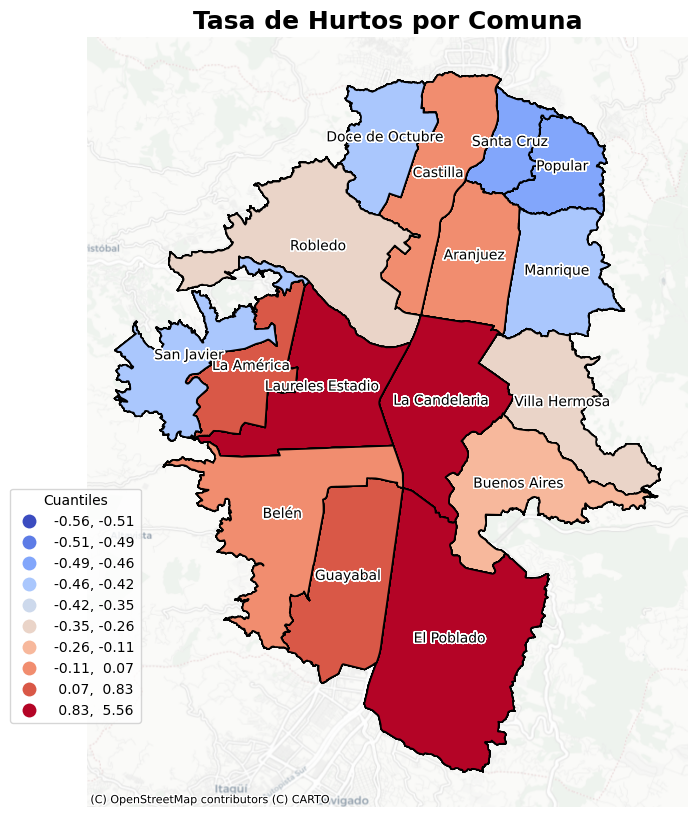

In [124]:
from matplotlib import patheffects


fig, ax = plt.subplots( figsize=(10, 10))
datos.plot(column='tasa_hurtos_normalizada', ax=ax, legend=True, cmap='coolwarm', edgecolor='black', linewidth=1.2, scheme='Quantiles', classification_kwds={'k': 10},
           legend_kwds={'loc': 'lower right', 'bbox_to_anchor': (0.1, 0.1), 'title': 'Cuantiles'})

for idx, row in datos.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['NOMBRE'], fontsize=10, ha='center', color='black', 
            path_effects=[patheffects.withStroke(linewidth=2, foreground="white")])  # Contorno blanco alrededor del texto


ax.set_title('Tasa de Hurtos por Comuna', fontsize=18, fontweight='bold')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios.crs.to_string())


ax.set_axis_off()

plt.show()


In [125]:
print(df['tasa_hurtos_normalizada'].describe())

print(df.groupby('year')['tasa_hurtos'].describe())


count    1.440000e+02
mean     2.467162e-17
std      1.003490e+00
min     -5.551912e-01
25%     -4.706073e-01
50%     -3.519913e-01
75%     -4.192857e-03
max      5.556196e+00
Name: tasa_hurtos_normalizada, dtype: float64
      count         mean          std         min         25%          50%  \
year                                                                         
2014   16.0   430.254848   846.502082   26.968508   57.980385   246.936352   
2015   16.0   681.249961  1450.575312   72.870084  125.129559   348.987729   
2016   16.0   972.886116  1707.584740  121.269439  191.481322   494.974533   
2017   16.0  1446.334511  2714.620106  126.537200  196.646959   642.604296   
2018   16.0  1995.721387  3427.712539  167.776184  344.188519   978.572443   
2019   16.0  2355.611717  3950.512982  238.881417  425.718461  1346.885837   
2020   16.0  1601.868742  2535.843399  195.750809  324.206561   889.711269   
2021   16.0  1955.505982  2782.170924  236.857507  376.783067  1035.120769  

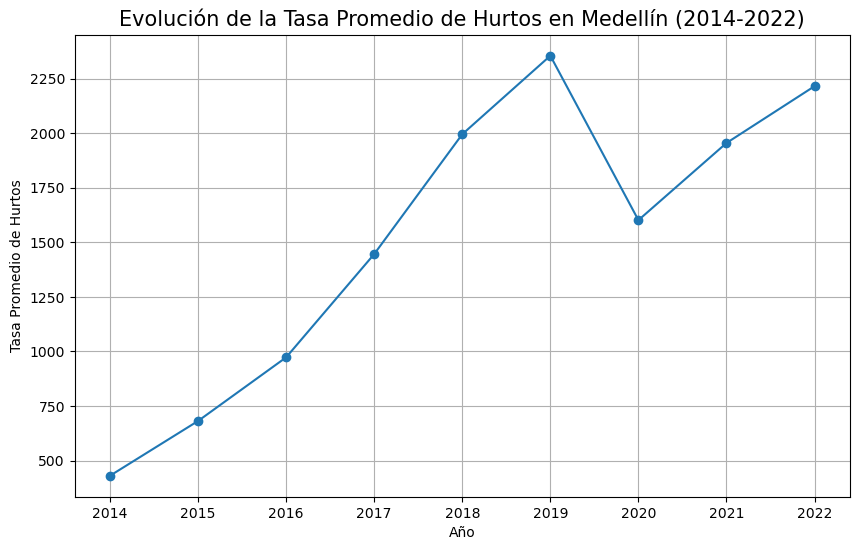

In [126]:
import matplotlib.pyplot as plt

# Promedio de hurtos por año
hurto_anual = df.groupby('year')['tasa_hurtos'].mean()

# Graficar
plt.figure(figsize=(10, 6))
hurto_anual.plot(marker='o')
plt.title('Evolución de la Tasa Promedio de Hurtos en Medellín (2014-2022)', fontsize=15)
plt.xlabel('Año')
plt.ylabel('Tasa Promedio de Hurtos')
plt.grid(True)
plt.show()


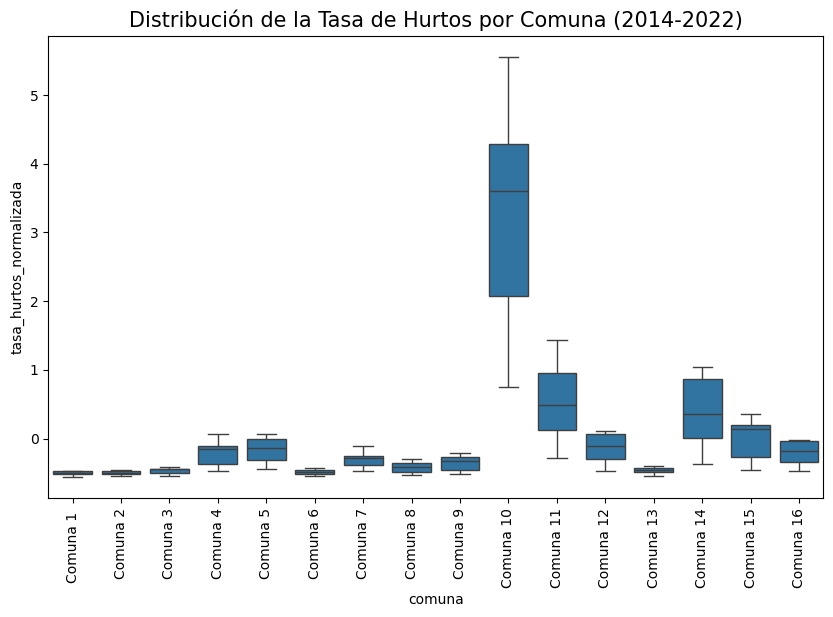

In [127]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x='comuna', y='tasa_hurtos_normalizada', data=df.reset_index())
plt.title('Distribución de la Tasa de Hurtos por Comuna (2014-2022)', fontsize=15)
plt.xticks(rotation=90)
plt.show()


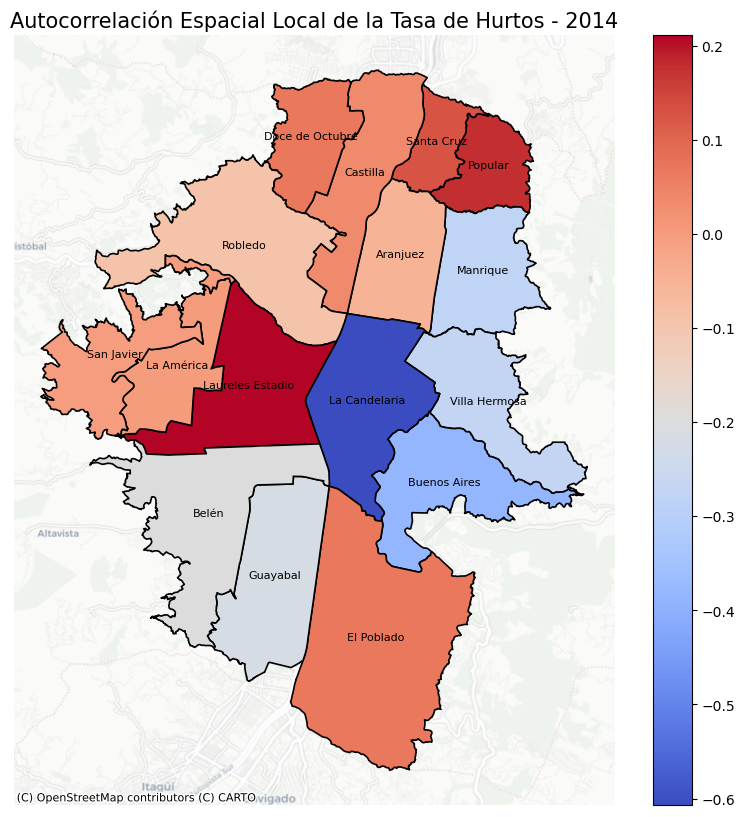

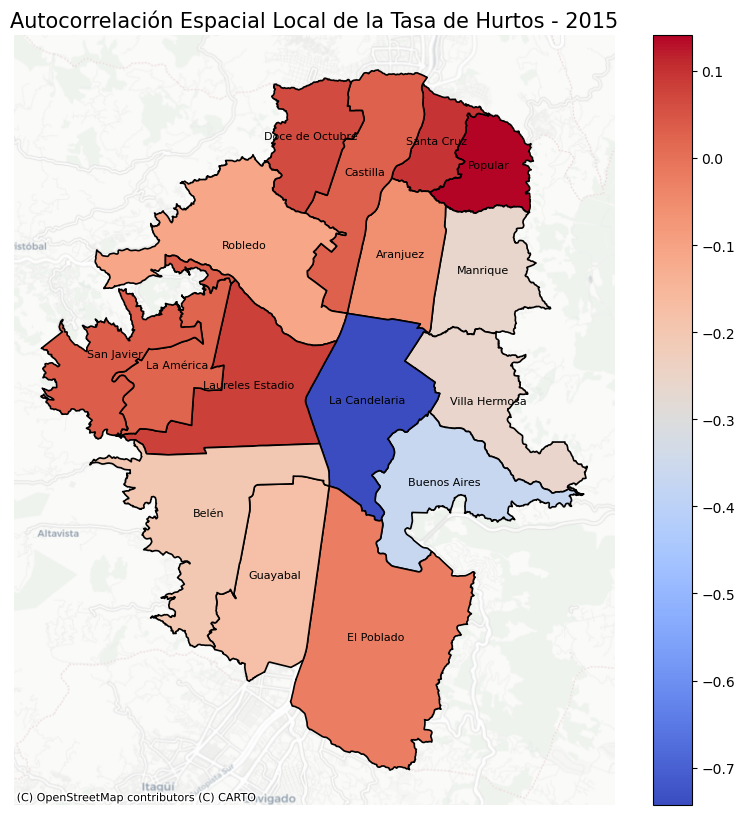

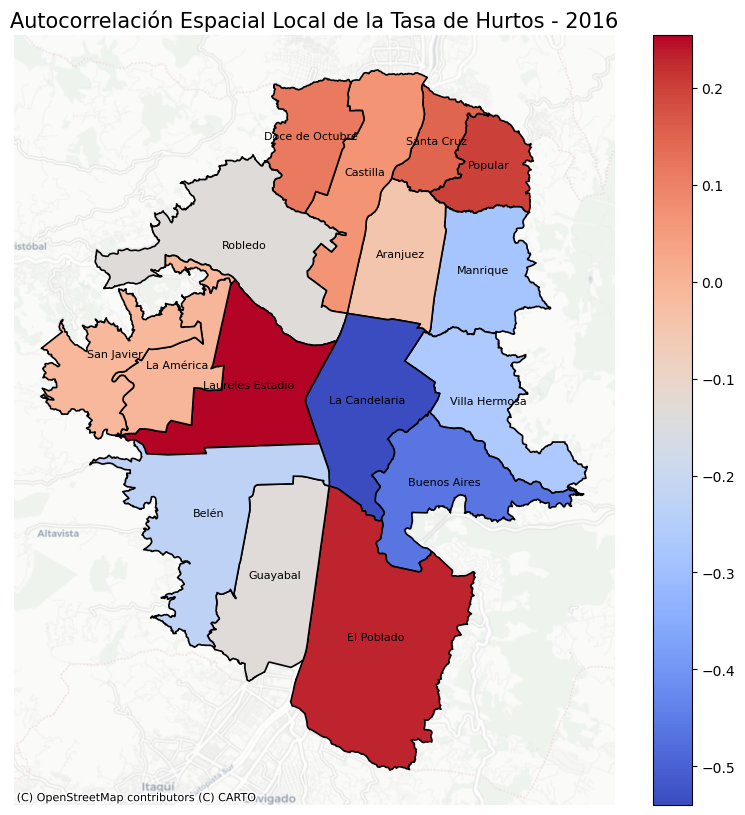

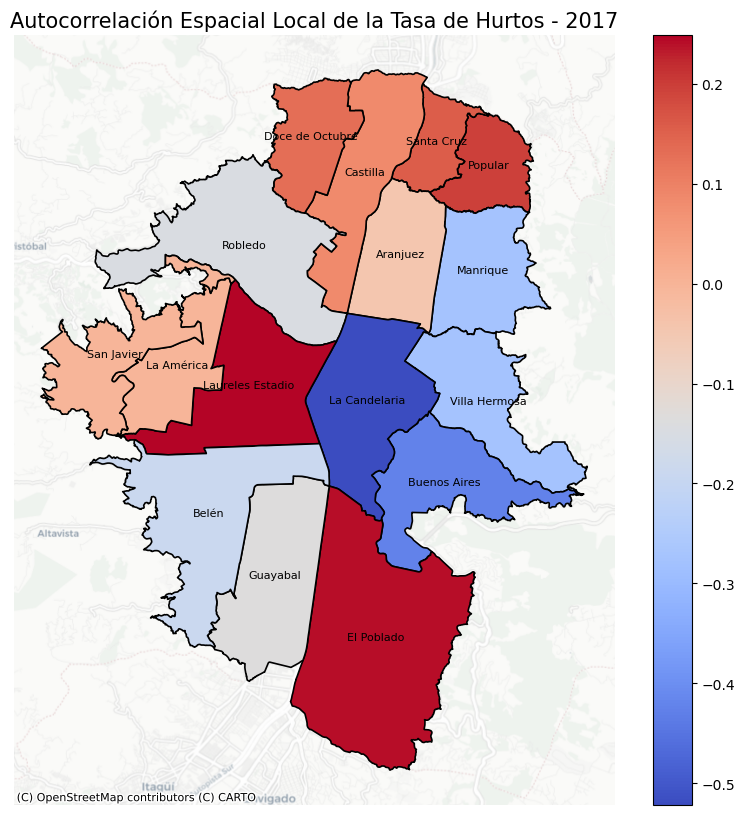

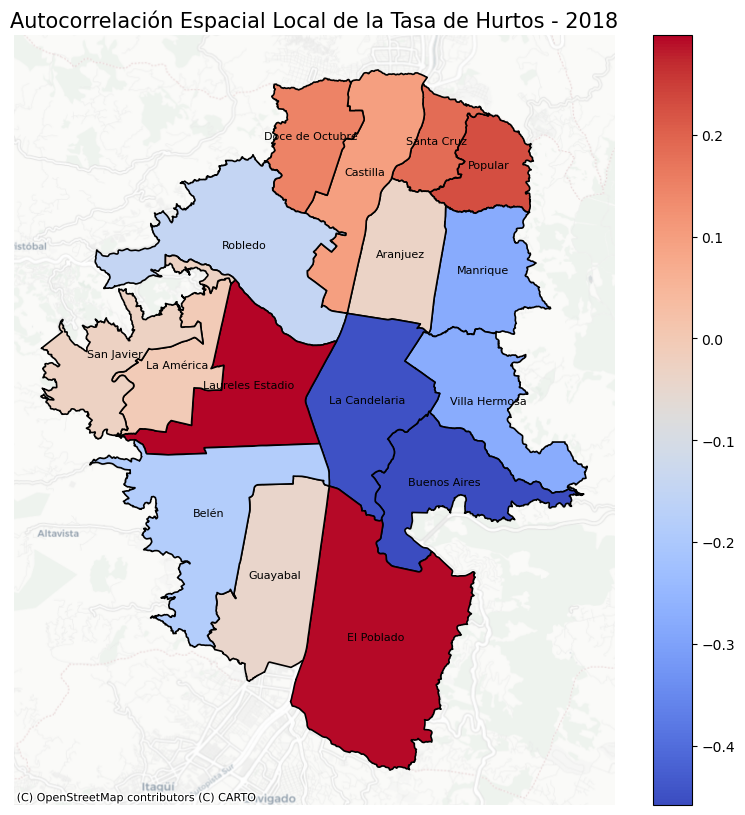

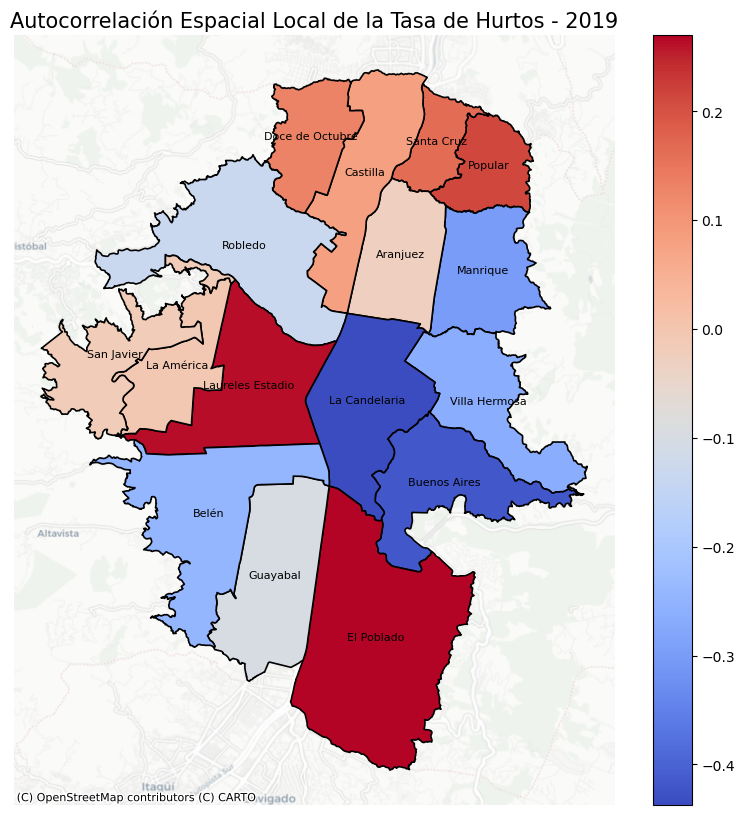

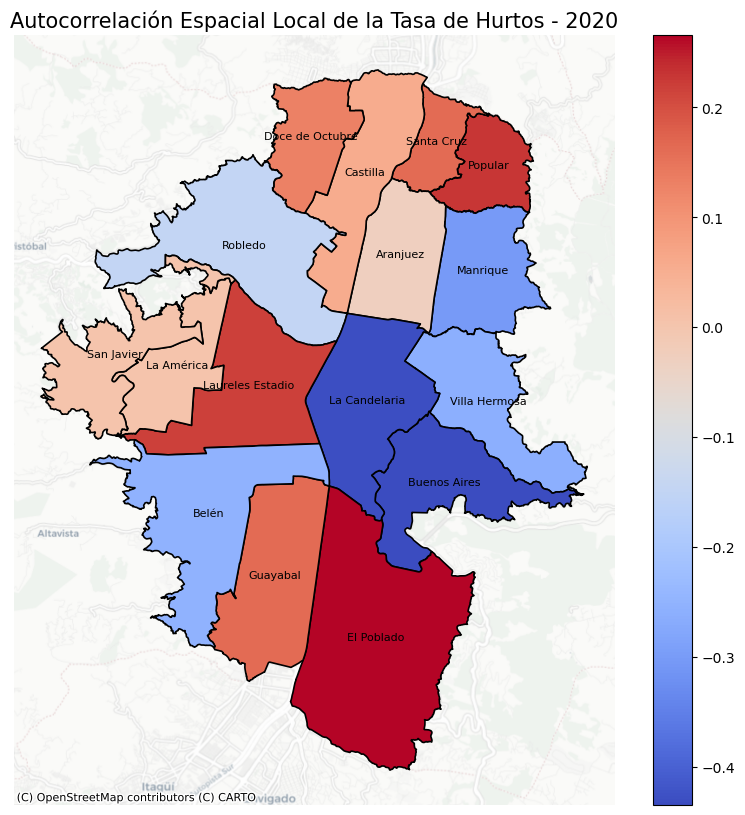

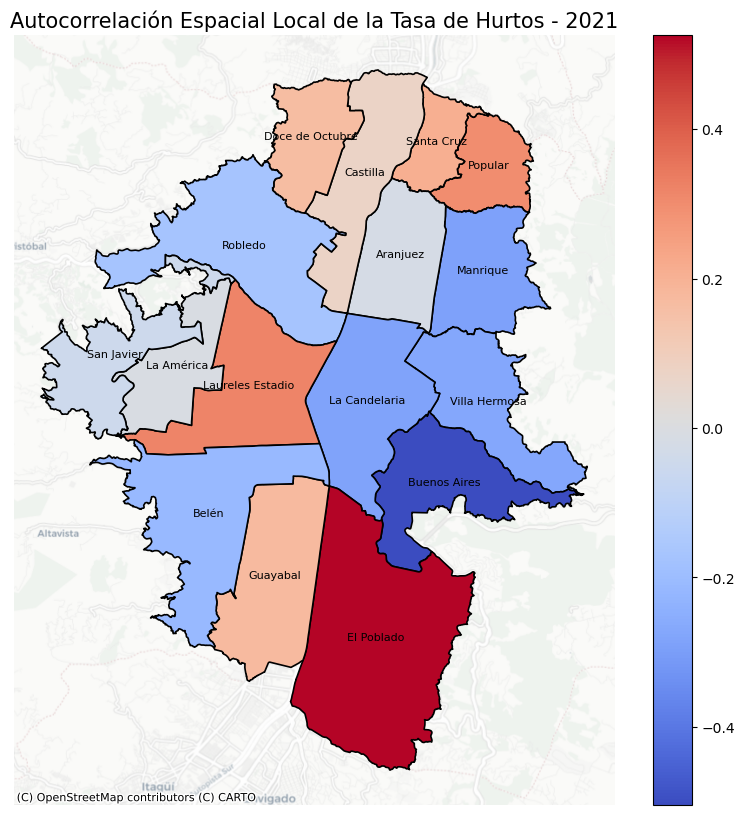

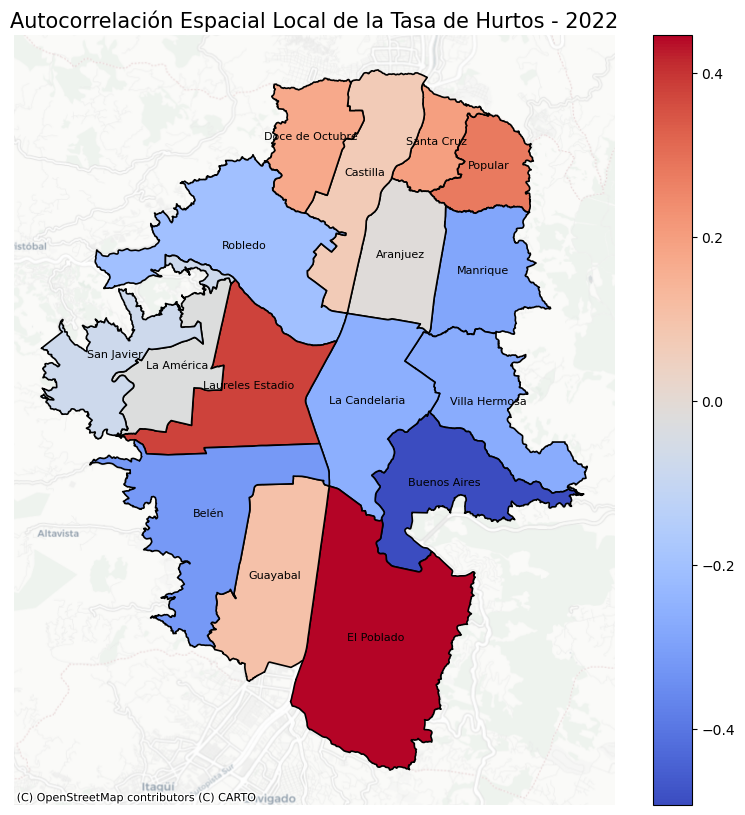

In [128]:
from esda import Moran_Local
import libpysal
import matplotlib.pyplot as plt
import pandas as pd

for year in datos['year'].unique():
    datos_year = datos[datos['year'] == year]

    w_year = libpysal.weights.Queen.from_dataframe(datos_year)

    moran_local = Moran_Local(datos_year['tasa_hurtos_normalizada'], w_year)

    datos_year['moran_local'] = moran_local.Is
    datos_year['significant'] = moran_local.p_sim < 0.05  # Significancia al 5%

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    datos_year.plot(column='moran_local', ax=ax, legend=True, cmap='coolwarm', edgecolor='black', linewidth=1.2)

    for idx, row in datos_year.iterrows():
        centroid = row['geometry'].centroid
        ax.text(centroid.x, centroid.y, row['NOMBRE'], fontsize=8, ha='center', color='black')

    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=datos_year.crs.to_string())
    ax.set_title(f'Autocorrelación Espacial Local de la Tasa de Hurtos - {year}', fontsize=15)
    ax.set_axis_off()
    plt.show()


In [129]:
from esda import Moran_Local

results = []

for year in datos['year'].unique():
    datos_year = datos[datos['year'] == year]

    w_year = libpysal.weights.Queen.from_dataframe(datos_year)

    moran_local = Moran_Local(datos_year['tasa_hurtos'], w_year)

    p_values = moran_local.p_sim

    slope = moran_local.Is.mean()

    results.append({'Year': year, 'Mean Moran I': slope, 'P-Value': p_values.mean()})

results_df = pd.DataFrame(results)
print(results_df)


   Year  Mean Moran I   P-Value
0  2014     -0.087415  0.176875
1  2015     -0.107538  0.181000
2  2016     -0.068413  0.175313
3  2017     -0.059821  0.171312
4  2018     -0.040856  0.169812
5  2019     -0.051498  0.178313
6  2020     -0.038928  0.184000
7  2021     -0.002805  0.168938
8  2022     -0.018559  0.176687


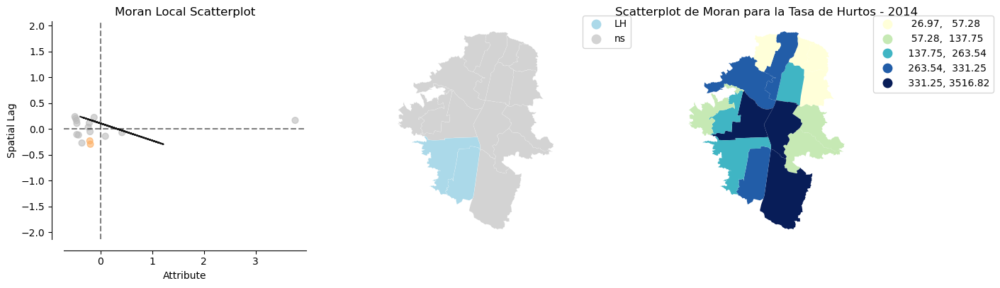

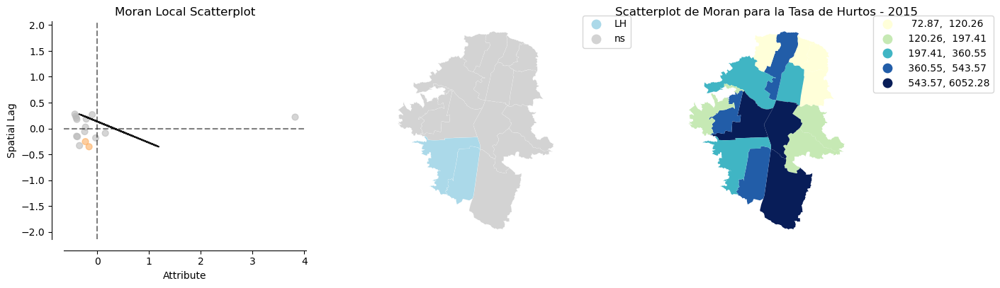

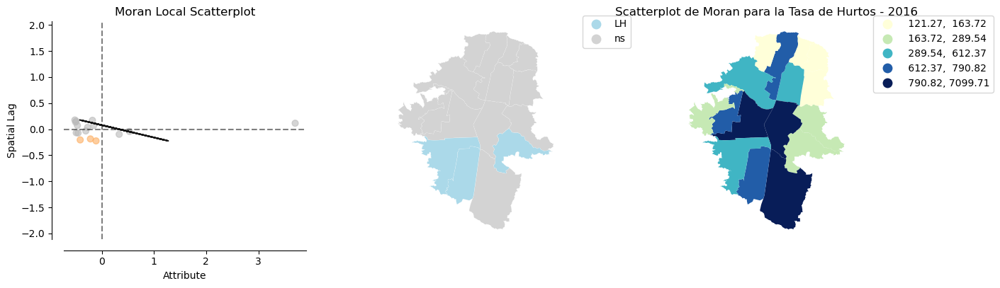

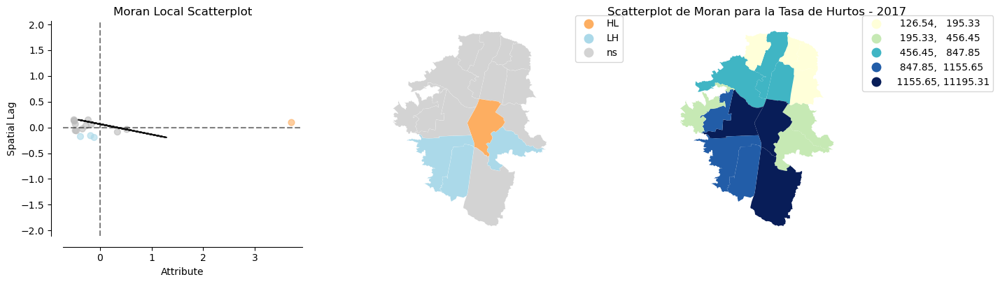

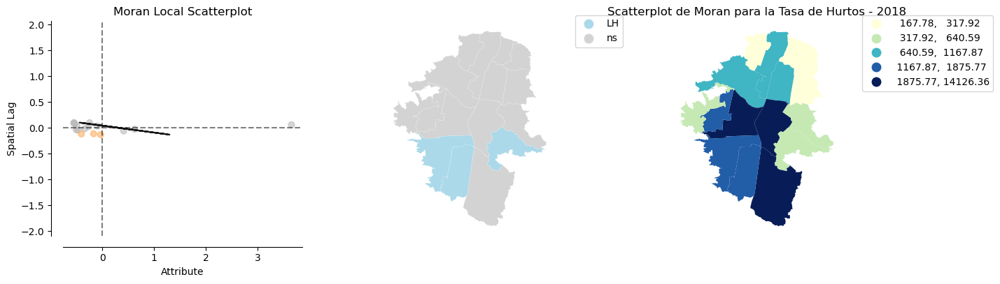

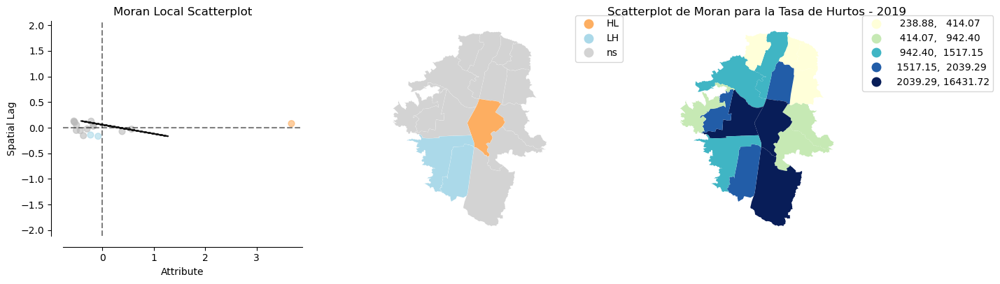

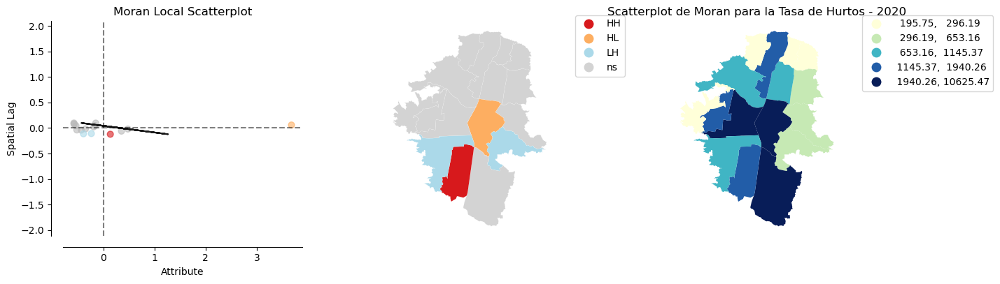

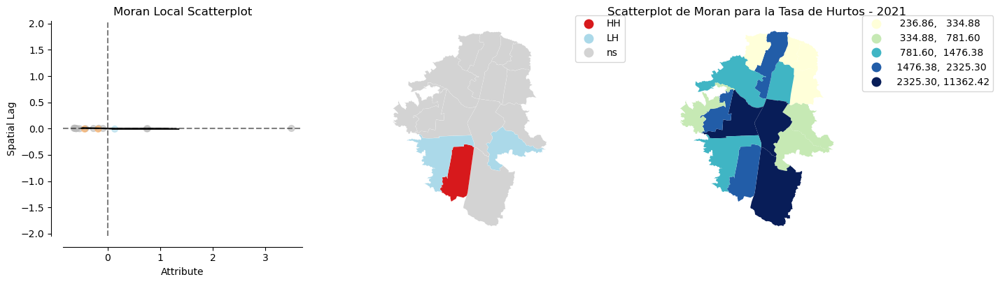

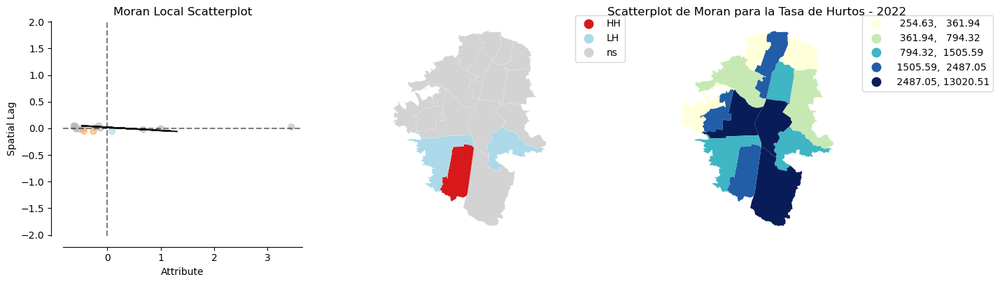

In [130]:
from splot.esda import moran_scatterplot


for year in datos['year'].unique():
    datos_year = datos[datos['year'] == year]

    w_year = libpysal.weights.Queen.from_dataframe(datos_year)

    moran_local = Moran_Local(datos_year['tasa_hurtos'], w_year)

    plot_local_autocorrelation(moran_local, datos_year, 'tasa_hurtos')
    plt.title(f'Scatterplot de Moran para la Tasa de Hurtos - {year}')
    plt.show()


In [131]:
results = []

for year in datos['year'].unique():
    datos_year = datos[datos['year'] == year]
    
    w_year = libpysal.weights.Queen.from_dataframe(datos_year)

    moran_local = Moran_Local(datos_year['tasa_hurtos'], w_year)
    
    datos_year['Moran_Local'] = moran_local.Is
    datos_year['p_value'] = moran_local.p_sim
    
    datos_year['Quadrant'] = np.where(
        (datos_year['Moran_Local'] > 0) & (datos_year['p_value'] < 0.05), 'AA', 
        np.where(
            (datos_year['Moran_Local'] > 0) & (datos_year['p_value'] >= 0.05), 'AB',
            np.where(
                (datos_year['Moran_Local'] <= 0) & (datos_year['p_value'] < 0.05), 'BA',
                'BB'
            )
        )
    )

    results.append(datos_year)

df_results = pd.concat(results)

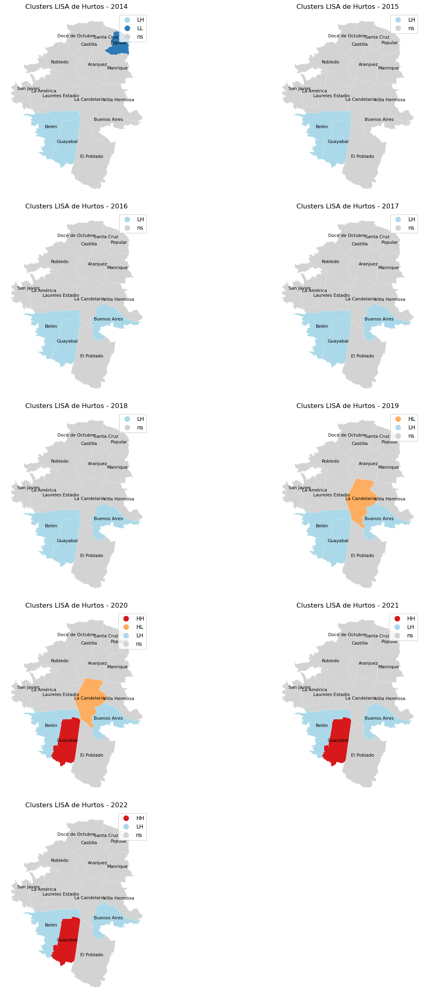

In [132]:
import matplotlib.pyplot as plt
from splot.esda import lisa_cluster
import libpysal

years = datos['year'].unique()
n_years = len(years)

n_rows = (n_years + 1) // 2  # Dividir por 2 y redondear hacia arriba si es impar

fig, axes = plt.subplots(n_rows, 2, figsize=(15, 5 * n_rows))

if n_rows == 1:
    axes = [axes]
else:
    axes = axes.flatten()

for ax, year in zip(axes, years):
    datos_year = datos[datos['year'] == year]
    
    w_year = libpysal.weights.Queen.from_dataframe(datos_year)
    
    moran_local = Moran_Local(datos_year['tasa_hurtos'], w_year)
    
    lisa_cluster(moran_local, datos_year, p=0.05, ax=ax)
    
    for idx, row in datos_year.iterrows():
        centroid = row['geometry'].centroid
        ax.text(centroid.x, centroid.y, row['NOMBRE'], fontsize=8, ha='center', color='black')
    
    ax.set_title(f'Clusters LISA de Hurtos - {year}')

if len(axes) > n_years:
    fig.delaxes(axes[-1])

plt.tight_layout()

plt.show()


In [133]:
moran_local.explore(datos_year, crit_value=0.05)

In [135]:
datos['CODIGO'] = pd.to_numeric(datos['CODIGO'], errors='coerce')
barrios['CODIGO'] = pd.to_numeric(barrios['CODIGO'], errors='coerce')

tasas_hurtos_pivot = datos.pivot_table(index='CODIGO', columns='year', values='tasa_hurtos')

tasas_hurtos_pivot.columns = [str(year) for year in tasas_hurtos_pivot.columns]

barrios = barrios.merge(tasas_hurtos_pivot, on='CODIGO', how='left')


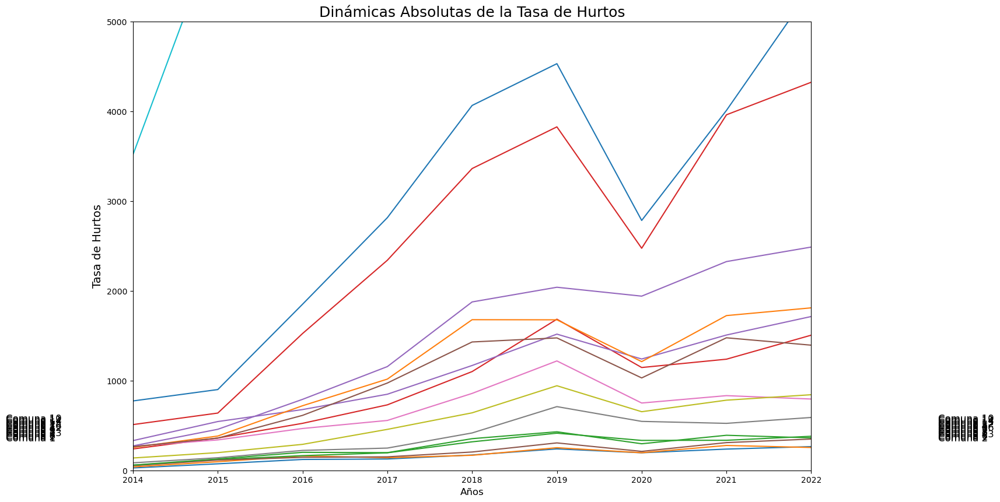

In [146]:
years = range(2014, 2023)  
names = np.array(barrios["IDENTIFICA"])  

order_2014 = np.argsort(barrios['2014']) 
order_2022 = np.argsort(barrios['2022'])  
names_2014 = names[order_2014[::-1]] 
names_2022 = names[order_2022[::-1]]  
first_last = np.vstack((names_2014, names_2022))  
tasa_hurtos = barrios.loc[:, '2014':'2022'].values  

from pylab import rcParams
rcParams["figure.figsize"] = 15, 10

plt.plot(years, tasa_hurtos.T)  

for i in range(len(names)):  
    plt.text(2012.5, 550 - (i * 15), first_last[0][i], fontsize=12)  
    plt.text(2023.5, 550 - (i * 15), first_last[1][i], fontsize=12)  

plt.xlim((years[0], years[-1]))
plt.ylim((0, 5000))
plt.ylabel(r"Tasa de Hurtos", fontsize=14)
plt.xlabel("Años", fontsize=12)
plt.title("Dinámicas Absolutas de la Tasa de Hurtos", fontsize=18)

plt.show()


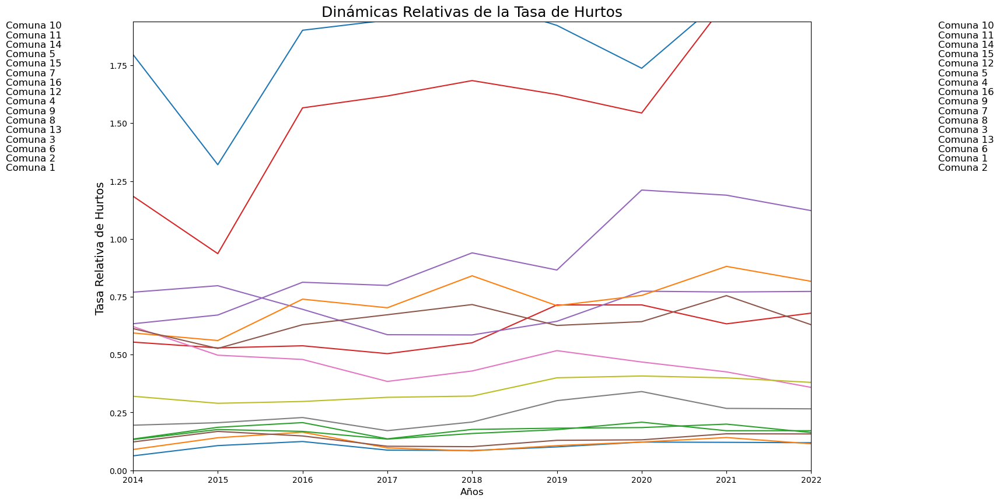

In [151]:
from pylab import rcParams

years = range(2014, 2023)  

tasa_hurtos = barrios.loc[:, '2014':'2022'].values  

mean_tasa_hurtos = tasa_hurtos.mean(axis=0)  

rpci = tasa_hurtos / mean_tasa_hurtos  

names = np.array(barrios["IDENTIFICA"])

order_2014 = np.argsort(rpci[:, 0])  
order_2022 = np.argsort(rpci[:, -1])  
names_2014 = names[order_2014[::-1]]  
names_2022 = names[order_2022[::-1]]  
first_last = np.vstack((names_2014, names_2022))  

rcParams["figure.figsize"] = 15, 10

plt.plot(years, rpci.T)  
for i in range(len(names)):  
    plt.text(2012.5, 1.91 - (i * 0.041), first_last[0][i], fontsize=12)  
    plt.text(2023.5, 1.91 - (i * 0.041), first_last[1][i], fontsize=12)  

plt.xlim((years[0], years[-1]))
plt.ylim((0, 1.94))
plt.ylabel(r"Tasa Relativa de Hurtos ", fontsize=14)
plt.xlabel("Años", fontsize=12)
plt.title("Dinámicas Relativas de la Tasa de Hurtos", fontsize=18)

plt.show()


In [154]:
import giddy 
tasa_hurtos = barrios.loc[:, '2014':'2022'].values  

q5 = np.array([mc.Quantiles(tasa, k=5).yb for tasa in tasa_hurtos.T]).transpose()

print(q5[:, 0])  

print(barrios["CODIGO"].values)

[0 0 0 2 3 0 3 1 1 4 4 2 1 4 3 2]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]


In [155]:
print(q5[4, :])  

[3 3 3 2 2 2 3 3 3]


In [156]:
m5 = giddy.markov.Markov(q5)

print(m5.transitions)

print(m5.p)

The Markov Chain is reducible and is composed by:
2 Recurrent classes (indices):
[0 1 2 3], [4]
0 Transient classes.
The Markov Chain has 1 absorbing state (index):
[4]
[[29.  3.  0.  0.  0.]
 [ 3. 20.  1.  0.  0.]
 [ 0.  1. 19.  4.  0.]
 [ 0.  0.  4. 20.  0.]
 [ 0.  0.  0.  0. 24.]]
[[0.90625    0.09375    0.         0.         0.        ]
 [0.125      0.83333333 0.04166667 0.         0.        ]
 [0.         0.04166667 0.79166667 0.16666667 0.        ]
 [0.         0.         0.16666667 0.83333333 0.        ]
 [0.         0.         0.         0.         1.        ]]


In [157]:
print(m5.steady_state)

mfpt = giddy.ergodic.mfpt(m5.p)
print(mfpt)

[[0.30769231 0.23076923 0.23076923 0.23076923 0.        ]
 [0.         0.         0.         0.         1.        ]]
[[ 3.25       10.66666667 66.66666667 86.66666667         inf]
 [24.          4.33333333 56.         76.                 inf]
 [72.         48.          4.33333333 20.                 inf]
 [78.         54.          6.          4.33333333         inf]
 [        inf         inf         inf         inf  1.        ]]


In [160]:
tasas = datos.pivot(index='CODIGO', columns='year', values='tasa_hurtos')

for year in range(2014, 2023):  # Ajusta el rango de años según tu necesidad
    barrios[f'tasa_hurtos_{year}'] = barrios['CODIGO'].map(tasas[year])


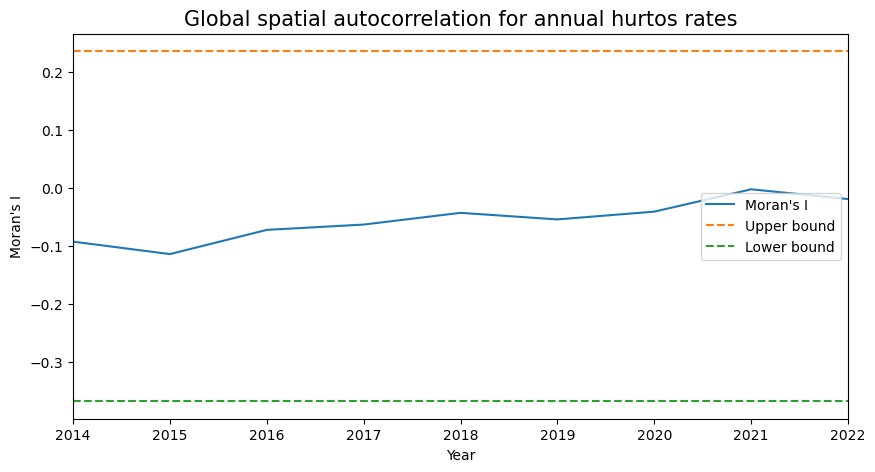

In [163]:
from esda.moran import Moran
w = libpysal.weights.Queen.from_dataframe(barrios)  # Puedes usar otros tipos de pesos espaciales
w.transform = "R"

years = tasas.columns
res = []
for year in years:
    cs = tasas[year].values
    mi = Moran(cs, w)
    res.append((mi.I, mi.EI, mi.seI_norm, mi.sim[974]))

res = np.array(res)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
ax.plot(years, res[:, 0], label="Moran's I")
ax.plot(years, res[:, 1] + 1.96 * res[:, 2], label="Upper bound", linestyle="dashed")
ax.plot(years, res[:, 1] - 1.96 * res[:, 2], label="Lower bound", linestyle="dashed")
ax.set_title(
    "Global spatial autocorrelation for annual hurtos rates",
    fontdict={"fontsize": 15},
)
ax.set_xlim([years.min(), years.max()])
ax.legend()
plt.xlabel('Year')
plt.ylabel("Moran's I")
plt.show()

In [186]:
tasas_adjusted = datos.pivot(index='CODIGO', columns='year', values='tasa_hurtos').fillna(0).values.T

In [192]:
from giddy.markov import Spatial_Markov

sm = Spatial_Markov(
    y=tasas_adjusted.T,         # Datos en formato (n, t)
    w=w,                      # Matriz de pesos espaciales
    k=4,                      # Número de clases para las tasas de hurtos
    m=4,                      # Número de clases para los lags espaciales
    fixed=True,               # Discretización fija
    variable_name='tasa_hurtos'
)

In [195]:
print(sm.p)

[[0.75       0.25       0.         0.        ]
 [0.03225806 0.64516129 0.32258065 0.        ]
 [0.         0.03225806 0.70967742 0.25806452]
 [0.         0.         0.1        0.9       ]]


In [196]:
sm.summary()

---------------------------------------------------
          Spatial Markov Test: tasa_hurtos         
---------------------------------------------------
Number of classes: 4
Number of transitions: 128
Number of regimes: 4
Regime names: LAG0, LAG1, LAG2, LAG3
---------------------------------------------------
   Test                   LR                Chi-2
  Stat.               23.186               22.262
    DOF                   17                   17
p-value                0.143                0.175
---------------------------------------------------
P(H0)           C0         C1         C2         C3
     C0      0.750      0.250      0.000      0.000
     C1      0.032      0.645      0.323      0.000
     C2      0.000      0.032      0.710      0.258
     C3      0.000      0.000      0.100      0.900
---------------------------------------------------
P(LAG0)         C0         C1         C2         C3
     C0      0.857      0.143      0.000      0.000
     C1      0.000

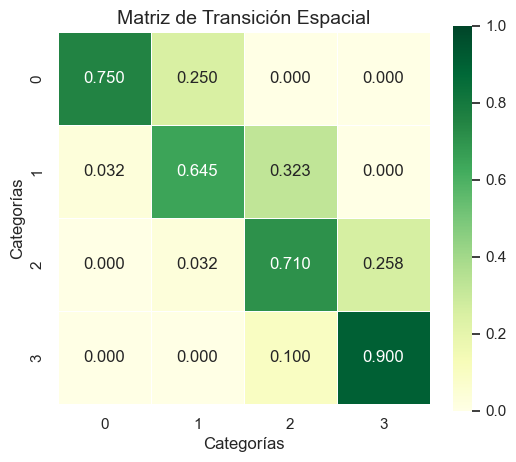

In [197]:
sns.set()

sns_kws = dict(
    annot=True,
    linewidths=0.5,
    cbar=True,
    vmin=0,
    vmax=1,
    square=True,
    cmap="YlGn",
    fmt=".3f",
)

fig, ax = plt.subplots(figsize=(6, 5))  
im = sns.heatmap(sm.p, ax=ax, **sns_kws)

ax.set_title('Matriz de Transición Espacial', fontsize=14)
ax.set_xlabel('Categorías', fontsize=12)
ax.set_ylabel('Categorías', fontsize=12)

plt.show()

In [198]:
giddy.markov.Homogeneity_Results(sm.T).summary()

-----------------------------------------
         Markov Homogeneity Test         
-----------------------------------------
Number of classes: 4
Number of transitions: 128
Number of regimes: 4
Regime names: 0, 1, 2, 3
-----------------------------------------
   Test                   LR                Chi-2
  Stat.               23.186               22.262
    DOF                   17                   17
p-value                0.143                0.175
-----------------------------------------
P(H0)        0        1        2        3
    0    0.750    0.250    0.000    0.000
    1    0.032    0.645    0.323    0.000
    2    0.000    0.032    0.710    0.258
    3    0.000    0.000    0.100    0.900
-----------------------------------------
P(0)         0        1        2        3
    0    0.857    0.143    0.000    0.000
    1    0.000    0.600    0.400    0.000
    2    0.000    0.000    0.500    0.500
    3    0.000    0.000    0.000    1.000
----------------------------------

In [199]:
import giddy.markov
import giddy.ergodic


lm = giddy.markov.LISA_Markov(
    y=tasas_adjusted.T,             # Datos en formato (n, t)
    w=w,                           # Matriz de pesos espaciales
    permutations=0,                # Número de permutaciones (0 para no realizar permutaciones)
    significance_level=0.05,       # Nivel de significancia
    geoda_quads=False              # Usar geoda quadrants si es True
)

print("Clases de LISA:")
print(lm.classes)

print("\nTransiciones LISA:")
print(lm.transitions)

print("\nMatriz de Probabilidades de Transición:")
print(lm.p)

print("\nDistribución Estacionaria de Largo Plazo:")
print(lm.steady_state)

print("\nTiempo Medio de Primer Paso (MFPT):")
print(giddy.ergodic.mfpt(lm.p))

print("\nEstadístico Chi-cuadrado:")
print(lm.chi_2)

Clases de LISA:
[1 2 3 4]

Transiciones LISA:
[[16.  1.  0.  0.]
 [ 2. 61.  3.  0.]
 [ 0.  4. 33.  0.]
 [ 0.  0.  0.  8.]]

Matriz de Probabilidades de Transición:
[[0.94117647 0.05882353 0.         0.        ]
 [0.03030303 0.92424242 0.04545455 0.        ]
 [0.         0.10810811 0.89189189 0.        ]
 [0.         0.         0.         1.        ]]

Distribución Estacionaria de Largo Plazo:
[[0.26614481 0.51663405 0.21722114 0.        ]
 [0.         0.         0.         1.        ]]

Tiempo Medio de Primer Paso (MFPT):
[[ 3.75735294 17.         50.33333333         inf]
 [46.875       1.93560606 33.33333333         inf]
 [56.125       9.25        4.6036036          inf]
 [        inf         inf         inf  1.        ]]

Estadístico Chi-cuadrado:
(102.49555758379063, 0.0, 9)


lisa_labels = ['BB', 'BA', 'AB', 'AA']

# Matriz de Transiciones
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(lm.transitions, annot=True, cmap="YlGnBu", fmt=".2f", ax=ax, cbar=True, 
            xticklabels=lisa_labels, yticklabels=lisa_labels)
ax.set_title('Matriz de Transiciones LISA')
ax.set_xlabel('Clase de LISA al final del periodo')
ax.set_ylabel('Clase de LISA al inicio del periodo')
plt.show()

# Matriz de Probabilidades de Transición
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(lm.p, annot=True, cmap="YlGnBu", fmt=".2f", ax=ax, cbar=True, 
            xticklabels=lisa_labels, yticklabels=lisa_labels)
ax.set_title('Matriz de Probabilidades de Transición LISA')
ax.set_xlabel('Clase de LISA al final del periodo')
ax.set_ylabel('Clase de LISA al inicio del periodo')
plt.show()

## Para el desempleo

In [206]:
tasas_desempleo_pivot = datos.pivot_table(index='CODIGO', columns='year', values='Tasa_Desempleo')

tasas_desempleo_pivot.columns = [str(year) for year in tasas_desempleo_pivot.columns]


In [209]:
barrios = gpd.read_file("C:\\Users\\johng\Downloads\\trabajo_grado\\medellin.shp")
barrios = barrios.merge(tasas_desempleo_pivot, on='CODIGO', how='left')


<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\johng\AppData\Local\Temp\ipykernel_21380\2172716433.py:2: SyntaxWarning: invalid escape sequence '\D'
  barrios = gpd.read_file("C:\\Users\\johng\Downloads\\trabajo_grado\\medellin.shp")


In [210]:
barrios

,OBJECTID,CODIGO,NOMBRE,IDENTIFICA,LIMITEMUNI,SUBTIPO_CO,LINK_DOCUM,geometry,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,1,1,Popular,Comuna 1,001,1,None,"POLYGON ((-75.54803 6.30436, -75.54795 6.30431...",11.479819,10.677207,14.177746,14.908453,13.599638,17.896898,22.940308,20.590952,16.474616
1,2,2,Santa Cruz,Comuna 2,001,1,None,"POLYGON ((-75.55703 6.31007, -75.55699 6.31003...",11.194617,10.989729,11.259335,11.155144,13.110653,12.540468,21.885517,19.633042,14.041503
2,3,3,Manrique,Comuna 3,001,1,None,"POLYGON ((-75.54252 6.28632, -75.54252 6.28632...",10.974426,12.628419,10.916530,11.977840,13.842529,13.160689,26.915300,20.939362,12.603901
3,4,4,Aranjuez,Comuna 4,001,1,None,"POLYGON ((-75.56229 6.29126, -75.56221 6.29125...",9.544182,9.447663,9.221549,11.028326,12.669965,13.462460,19.273303,18.298436,14.502637
4,5,5,Castilla,Comuna 5,001,1,None,"POLYGON ((-75.56566 6.31261, -75.56559 6.31259...",7.699793,9.702011,8.198321,8.899988,11.627208,10.754313,18.092194,17.602133,10.138455
5,6,6,Doce de Octubre,Comuna 6,001,1,None,"POLYGON ((-75.57586 6.31093, -75.57584 6.31092...",10.650799,8.756212,11.096872,13.296131,12.808991,14.237391,21.340294,18.631454,14.275255
6,7,7,Robledo,Comuna 7,001,1,None,"POLYGON ((-75.59050 6.29592, -75.59049 6.29590...",8.905047,9.658613,8.932920,10.766913,12.612421,12.321961,19.378063,13.790691,10.272986
7,8,8,Villa Hermosa,Comuna 8,001,1,None,"POLYGON ((-75.55077 6.26237, -75.55071 6.26237...",9.316295,12.176267,9.571136,12.278638,12.155816,14.648933,21.365964,17.731072,12.808043
8,9,9,Buenos Aires,Comuna 9,001,1,None,"POLYGON ((-75.55502 6.24505, -75.55501 6.24504...",7.091257,9.992083,9.092824,11.203940,11.359479,13.940157,19.145952,15.321959,11.558161
9,10,10,La Candelaria,Comuna 10,001,1,None,"POLYGON ((-75.56426 6.26394, -75.56412 6.26393...",8.546346,6.038222,11.204997,9.075165,9.830347,13.608868,19.035048,14.673096,9.156854


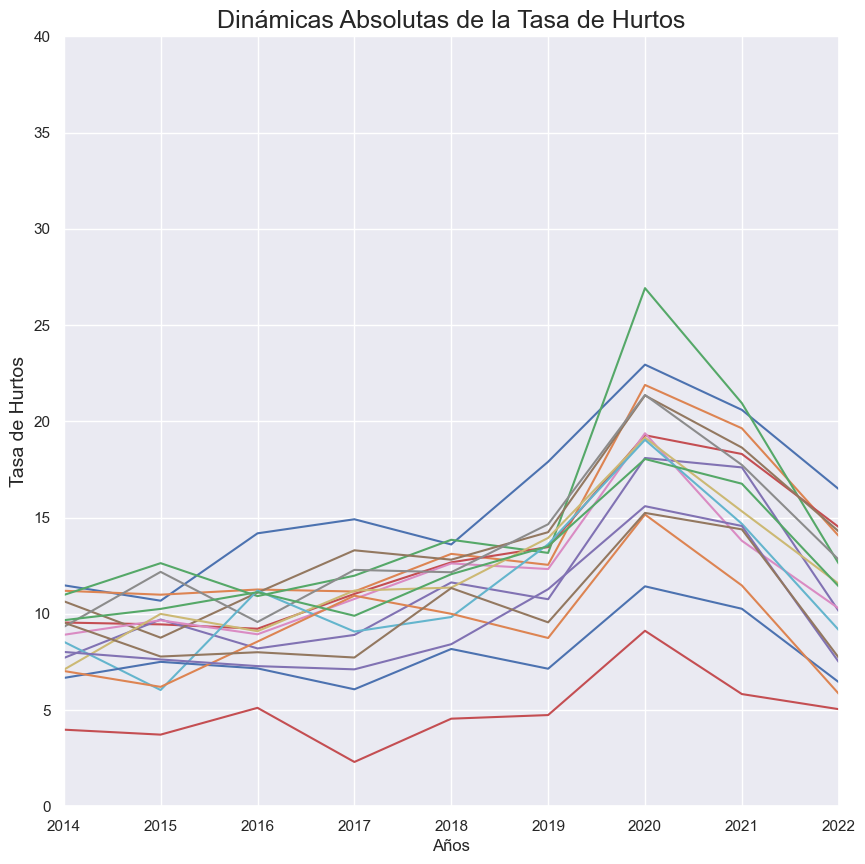

In [216]:
years = range(2014, 2023)  
names = np.array(barrios["IDENTIFICA"]) 

order_2014 = np.argsort(barrios['2014'])  # Ordenar por tasa de hurtos en 2014
order_2022 = np.argsort(barrios['2022'])  # Ordenar por tasa de hurtos en 2022
names_2014 = names[order_2014[::-1]]  # Nombres ordenados en 2014 (de mayor a menor)
names_2022 = names[order_2022[::-1]]  # Nombres ordenados en 2022 (de mayor a menor)
first_last = np.vstack((names_2014, names_2022))  # Nombres de comunas en 2014 y 2022

tasa_hurtos = barrios.loc[:, '2014':'2022'].values  # Extraer solo los años como strings

from pylab import rcParams
rcParams["figure.figsize"] = 10, 10

plt.plot(years, tasa_hurtos.T)  


# Ajustes del gráfico
plt.xlim((years[0], years[-1]))
plt.ylim((0, 40))
plt.ylabel(r"Tasa de Hurtos", fontsize=14)
plt.xlabel("Años", fontsize=12)
plt.title("Dinámicas Absolutas de la Tasa de Hurtos", fontsize=18)

# Mostrar el gráfico
plt.show()


In [220]:
import giddy 
tasa_desempleo = barrios.loc[:, '2014':'2022'].values  # (n_comunas, n_años)

q5 = np.array([mc.Quantiles(tasa, k=5).yb for tasa in tasa_desempleo.T]).transpose()

print(q5[:, 0])  

print(barrios["CODIGO"].values)

[4 4 4 3 1 3 2 2 0 1 0 0 3 0 1 2]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]


In [221]:
m5 = giddy.markov.Markov(q5)

print(m5.transitions)

print(m5.p)

The Markov Chain is irreducible and is composed by:
1 Recurrent class (indices):
[0 1 2 3 4]
0 Transient classes.
The Markov Chain has 0 absorbing states.
[[24.  4.  1.  2.  1.]
 [ 7.  7.  7.  3.  0.]
 [ 0.  7.  7.  5.  5.]
 [ 1.  5.  5.  6.  7.]
 [ 0.  1.  4.  8. 11.]]
[[0.75       0.125      0.03125    0.0625     0.03125   ]
 [0.29166667 0.29166667 0.29166667 0.125      0.        ]
 [0.         0.29166667 0.29166667 0.20833333 0.20833333]
 [0.04166667 0.20833333 0.20833333 0.25       0.29166667]
 [0.         0.04166667 0.16666667 0.33333333 0.45833333]]


In [222]:
print(m5.steady_state)

mfpt = giddy.ergodic.mfpt(m5.p)
print(mfpt)

[0.25   0.1875 0.1875 0.1875 0.1875]
[[ 4.          7.03968719  9.40084718  8.96187683 12.54349951]
 [ 9.6516129   5.33333333  6.33170414  7.45259042 11.29279896]
 [14.03870968  5.2629521   5.33333333  5.7086999   8.25597915]
 [13.93548387  5.96050831  5.94434669  5.33333333  7.46041056]
 [15.48387097  7.13352884  5.99126751  4.17595308  5.33333333]]


In [223]:
tasas = datos.pivot(index='CODIGO', columns='year', values='Tasa_Desempleo')

for year in range(2014, 2023):  # Ajusta el rango de años según tu necesidad
    barrios[f'tasa_hurtos_{year}'] = barrios['CODIGO'].map(tasas[year])


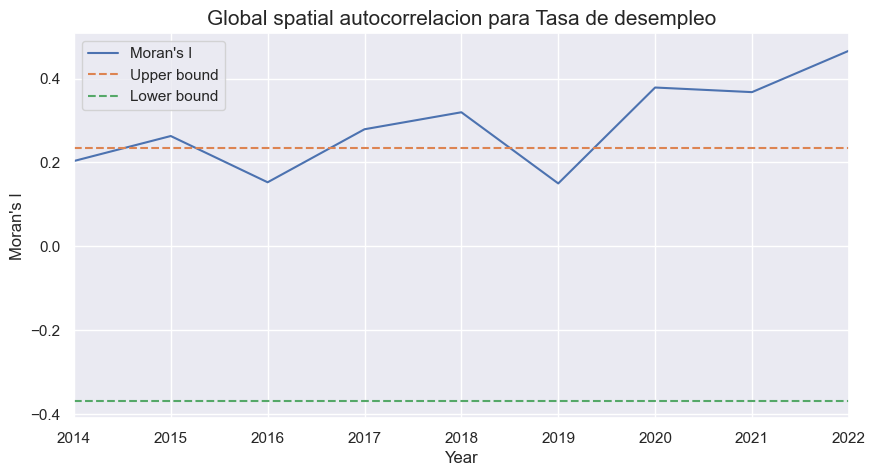

In [226]:
from esda.moran import Moran
w = libpysal.weights.Queen.from_dataframe(barrios)  
w.transform = "R"

years = tasas.columns
res = []
for year in years:
    cs = tasas[year].values
    mi = Moran(cs, w)
    res.append((mi.I, mi.EI, mi.seI_norm, mi.sim[974]))

res = np.array(res)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
ax.plot(years, res[:, 0], label="Moran's I")
ax.plot(years, res[:, 1] + 1.96 * res[:, 2], label="Upper bound", linestyle="dashed")
ax.plot(years, res[:, 1] - 1.96 * res[:, 2], label="Lower bound", linestyle="dashed")
ax.set_title(
    "Global spatial autocorrelacion para Tasa de desempleo",
    fontdict={"fontsize": 15},
)
ax.set_xlim([years.min(), years.max()])
ax.legend()
plt.xlabel('Year')
plt.ylabel("Moran's I")
plt.show()

In [227]:
tasas_adjusted = datos.pivot(index='CODIGO', columns='year', values='Tasa_Desempleo').fillna(0).values.T

In [228]:
from giddy.markov import Spatial_Markov

sm = Spatial_Markov(
    y=tasas_adjusted.T,         # Datos en formato (n, t)
    w=w,                      # Matriz de pesos espaciales
    k=4,                      # Número de clases para las tasas de hurtos
    m=4,                      # Número de clases para los lags espaciales
    fixed=True,               # Discretización fija
    variable_name='Tasa_Desempleo'
)

In [229]:
sm.summary()

---------------------------------------------------
        Spatial Markov Test: Tasa_Desempleo        
---------------------------------------------------
Number of classes: 4
Number of transitions: 128
Number of regimes: 4
Regime names: LAG0, LAG1, LAG2, LAG3
---------------------------------------------------
   Test                   LR                Chi-2
  Stat.               50.971               50.418
    DOF                   33                   33
p-value                0.024                0.027
---------------------------------------------------
P(H0)           C0         C1         C2         C3
     C0      0.645      0.194      0.129      0.032
     C1      0.182      0.364      0.364      0.091
     C2      0.031      0.281      0.344      0.344
     C3      0.062      0.062      0.219      0.656
---------------------------------------------------
P(LAG0)         C0         C1         C2         C3
     C0      0.824      0.059      0.118      0.000
     C1      0.182

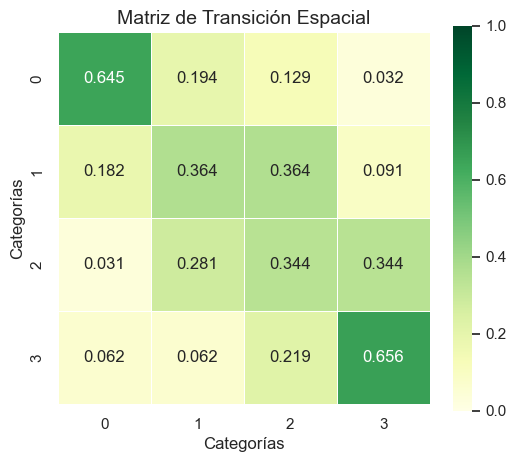

In [230]:
sns.set()

sns_kws = dict(
    annot=True,
    linewidths=0.5,
    cbar=True,
    vmin=0,
    vmax=1,
    square=True,
    cmap="YlGn",
    fmt=".3f",
)

fig, ax = plt.subplots(figsize=(6, 5))  # Ajusta el tamaño según sea necesario

im = sns.heatmap(sm.p, ax=ax, **sns_kws)

ax.set_title('Matriz de Transición Espacial', fontsize=14)
ax.set_xlabel('Categorías', fontsize=12)
ax.set_ylabel('Categorías', fontsize=12)

plt.show()

In [231]:
giddy.markov.Homogeneity_Results(sm.T).summary()

-----------------------------------------
         Markov Homogeneity Test         
-----------------------------------------
Number of classes: 4
Number of transitions: 128
Number of regimes: 4
Regime names: 0, 1, 2, 3
-----------------------------------------
   Test                   LR                Chi-2
  Stat.               50.971               50.418
    DOF                   33                   33
p-value                0.024                0.027
-----------------------------------------
P(H0)        0        1        2        3
    0    0.645    0.194    0.129    0.032
    1    0.182    0.364    0.364    0.091
    2    0.031    0.281    0.344    0.344
    3    0.062    0.062    0.219    0.656
-----------------------------------------
P(0)         0        1        2        3
    0    0.824    0.059    0.118    0.000
    1    0.182    0.636    0.182    0.000
    2    0.000    0.500    0.250    0.250
    3    0.000    0.000    0.000    0.000
----------------------------------

In [232]:
import giddy.markov
import giddy.ergodic


lm = giddy.markov.LISA_Markov(
    y=tasas_adjusted.T,             # Datos en formato (n, t)
    w=w,                           # Matriz de pesos espaciales
    permutations=0,                # Número de permutaciones (0 para no realizar permutaciones)
    significance_level=0.05,       # Nivel de significancia
    geoda_quads=False              # Usar geoda quadrants si es True
)

print("Clases de LISA:")
print(lm.classes)

print("\nTransiciones LISA:")
print(lm.transitions)

print("\nMatriz de Probabilidades de Transición:")
print(lm.p)

print("\nDistribución Estacionaria de Largo Plazo:")
print(lm.steady_state)

print("\nTiempo Medio de Primer Paso (MFPT):")
print(giddy.ergodic.mfpt(lm.p))

print("\nEstadístico Chi-cuadrado:")
print(lm.chi_2)

Clases de LISA:
[1 2 3 4]

Transiciones LISA:
[[40.  4.  0.  4.]
 [ 4.  3.  3.  3.]
 [ 0.  4. 31.  8.]
 [ 3.  3.  9.  9.]]

Matriz de Probabilidades de Transición:
[[0.83333333 0.08333333 0.         0.08333333]
 [0.30769231 0.23076923 0.23076923 0.23076923]
 [0.         0.09302326 0.72093023 0.18604651]
 [0.125      0.125      0.375      0.375     ]]

Distribución Estacionaria de Largo Plazo:
[0.34856899 0.11106365 0.34899616 0.19137121]

Tiempo Medio de Primer Paso (MFPT):
[[ 2.86887255 10.95       13.0877193   9.41071429]
 [ 9.70588235  9.00384615  8.29824561  6.82142857]
 [15.29901961 10.18333333  2.86536108  5.85714286]
 [12.72058824  9.9         5.87719298  5.22544643]]

Estadístico Chi-cuadrado:
(57.22694565296321, 4.572255352108812e-09, 9)


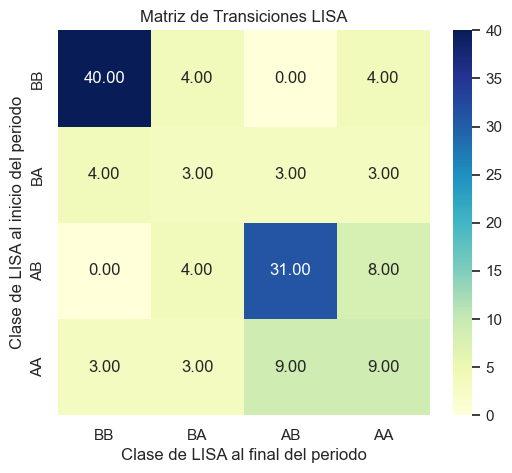

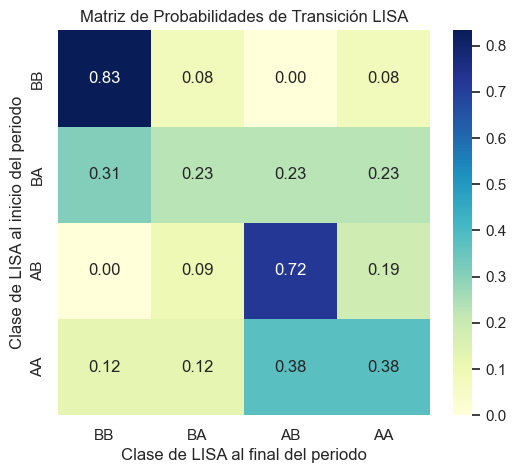

In [233]:
lisa_labels = ['BB', 'BA', 'AB', 'AA']

fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(lm.transitions, annot=True, cmap="YlGnBu", fmt=".2f", ax=ax, cbar=True, 
            xticklabels=lisa_labels, yticklabels=lisa_labels)
ax.set_title('Matriz de Transiciones LISA')
ax.set_xlabel('Clase de LISA al final del periodo')
ax.set_ylabel('Clase de LISA al inicio del periodo')
plt.show()

fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(lm.p, annot=True, cmap="YlGnBu", fmt=".2f", ax=ax, cbar=True, 
            xticklabels=lisa_labels, yticklabels=lisa_labels)
ax.set_title('Matriz de Probabilidades de Transición LISA')
ax.set_xlabel('Clase de LISA al final del periodo')
ax.set_ylabel('Clase de LISA al inicio del periodo')
plt.show()

In [238]:
!git status


"git" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.
